# **Pairs/Basket Selection in Energy Markets**

## **Introduction**

The energy markets offer unique opportunities for pairs trading due to their complex interdependencies and well-established economic relationships. From crude oil and its refined products to renewable energy ETFs and utility stocks, the energy sector encompasses a diverse set of assets with meaningful connections. These connections, driven by both fundamental economic factors and shared market dynamics, make the energy market a fertile ground for identifying pairs that exhibit long-term equilibrium or short-term mean-reverting behavior.

This notebook explores the selection of pairs or baskets of energy assets using a combination of economic intuition and statistical techniques. By identifying strong relationships between assets, we aim to uncover trading opportunities that leverage both fundamental and quantitative insights.

## **Table of Contents**
###   1. **Asset Universe**

### 2. **Data Download and Exploration**

### 3. **Economic-Based Pair Selection**

### 4. **Statistical-Based Pair Selection**

In [111]:
%load_ext autoreload
%autoreload 2

import json
import pandas as pd
import plotly.io as pio
from statsmodels.tsa.stattools import coint

import utility.plot_helpers as ph
import utility.data_processor_helpers as dph
import utility.statistics_helpers as sh

from config import start_insample, end_insample

pio.renderers.default = "notebook+pdf"
%config InlineBackend.figure_format = 'retina'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1. **Asset Universe** 

The Asset Universe combines a diverse set of assets to comprehensively capture key dynamics within the energy markets. It includes **futures**, **ETFs**, and **stocks** that reflect fossil fuel energy (e.g., crude oil, natural gas, gasoline, heating oil), energy-intensive metals (e.g., aluminum and copper), and renewable energy trends (e.g., solar, wind, and clean energy companies).

This selection balances traditional energy assets with metals and renewables to explore relationships across the full spectrum of the energy ecosystem. By integrating these categories, we aim to uncover actionable insights and interconnected trading opportunities.

### 1.1. **Futures**

Futures contracts are central to energy trading, providing benchmarks for commodity prices. Here we consider the **front-month** futures contract which correspond to the nearest expiration ones, so there is no need to form a continous futures contract from futures with different expiration dates. The selected futures include:
- **CL=F**: WTI Crude Oil Futures – U.S. benchmark for crude oil prices.
- **NG=F**: Henry Hub Natural Gas Futures – Key indicator for U.S. natural gas prices.
- Other selected futures represent key commodities like heating oil, gasoline, methanol, aluminum, and copper.

In [112]:
futures = {
    "ALI=F": "Aluminum Futures",
    "BZ=F": "Brent Crude Oil Futures",
    "CL=F": "WTI Crude Oil Futures",
    "HG=F": "Copper Futures",
    "HO=F": "Heating Oil Futures",
    "MTF=F": "Methanol Futures",
    "NG=F": "Henry Hub Natural Gas Futures",
    "RB=F": "RBOB Gasoline Futures"
}

### 1.2. **ETFs**

ETFs provide a convenient way to gain exposure to specific sectors or commodities. The selected ETFs include:
- **XLE**: Energy Select Sector SPDR Fund – Tracks the performance of the energy sector within the S&P 500.
- **USO**: United States Oil Fund ETF – Tracks the daily price movements of WTI Crude Oil.
- Other ETFs represent clean energy, utilities, and other niche markets like uranium and lithium.

In [113]:
etfs = {
    "FAN": "First Trust Global Wind Energy ETF",
    "ICLN": "iShares Global Clean Energy ETF",
    "IYE": "iShares U.S. Energy ETF",
    "LIT": "Global X Lithium & Battery Tech ETF",
    "TAN": "Invesco Solar ETF",
    "UGA": "United States Gasoline Fund ETF",
    "UNG": "United States Natural Gas Fund ETF",
    "URA": "Global X Uranium ETF",
    "USO": "United States Oil Fund ETF",
    "XLE": "Energy Select Sector SPDR Fund",
    "XLU": "Utilities Select Sector SPDR Fund",
    "XOP": "SPDR S&P Oil & Gas Exploration & Production ETF"
}

### 1.3. **Stocks**

Energy-related stocks offer insights into the performance of companies operating within the energy sector. The selected stocks include:
- **XOM**: ExxonMobil Corporation – A leading multinational oil and gas company.
- **CVX**: Chevron Corporation – A major integrated energy company.
- Other selected stocks include companies in oil exploration, renewable energy, and utilities.

In [114]:
stocks = {
    "AA": "Alcoa Corporation",
    "BP": "BP plc",
    "CVX": "Chevron Corporation",
    "ENPH": "Enphase Energy, Inc.",
    "EXC": "Exelon Corporation",
    "FE": "FirstEnergy Corp.",
    "FSLR": "First Solar, Inc.",
    "MPC": "Marathon Petroleum Corporation",
    "NEE": "NextEra Energy, Inc.",
    "NRG": "NRG Energy, Inc.",
    "SHEL": "Shell plc",
    "SLB": "Schlumberger Limited",
    "TTE": "TotalEnergies SE",
    "XOM": "ExxonMobil Corporation"
}

<a id="#2-data-download-and-exploration"></a>

## 2. **Data Download and Exploration**

In this section, we retrieve daily historical price data for our selected assets from Yahoo Finance, spanning the period from **January 1, 2010,** to **December 21, 2019**. This timeframe provides a robust dataset for analysis while avoiding **look-ahead bias** by reserving the later years for backtesting. Finally, we perform a small data exploration to get a sense of historical trends and linear relationships

In [118]:
tickers = {**futures, **etfs, **stocks}
prices = dph.fetch_data(list(tickers.keys()), start_insample, end_insample)
prices

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

Ticker,ALI=F,BZ=F,CL=F,HG=F,HO=F,MTF=F,NG=F,RB=F,FAN,ICLN,...,EXC,FE,FSLR,MPC,NEE,NRG,SHEL,SLB,TTE,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,NaN,80.120003,81.510002,3.3880,2.1905,NaN,5.884,2.1044,15.29,22.790001,...,34.864479,46.770000,135.460007,NaN,13.312500,23.870001,62.349998,67.110001,65.879997,69.150002
2010-01-05,NaN,80.589996,81.769997,3.3960,2.1941,NaN,5.637,2.1250,15.37,23.400000,...,34.293865,46.250000,137.399994,NaN,13.182500,24.240000,62.419998,67.300003,66.029999,69.419998
2010-01-06,NaN,81.889999,83.180000,3.4775,2.2032,NaN,6.009,2.1366,15.40,23.600000,...,34.500713,46.750000,140.020004,NaN,13.312500,24.770000,61.910000,68.800003,66.010002,70.019997
2010-01-07,NaN,81.510002,82.660004,3.4115,2.1836,NaN,5.806,2.1349,15.49,23.650000,...,34.614838,46.049999,140.479996,NaN,13.275000,24.910000,61.610001,69.510002,65.860001,69.800003
2010-01-08,NaN,81.370003,82.750000,3.3880,2.2003,NaN,5.749,2.1553,15.77,23.860001,...,34.450787,45.810001,139.679993,NaN,13.160000,24.500000,61.520000,70.650002,66.260002,69.519997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,1818.25,66.389999,60.520000,2.8170,2.0222,53.400002,2.214,1.7051,14.46,11.710000,...,32.239658,48.389999,57.860001,60.660000,59.695000,40.080002,58.799999,40.790001,55.040001,70.290001
2019-12-24,1823.00,67.199997,61.110001,2.8385,2.0363,53.400002,2.172,1.7270,14.49,11.740000,...,32.325249,48.480000,57.980000,60.970001,60.127499,39.889999,58.700001,40.650002,54.779999,70.019997
2019-12-26,1823.00,67.919998,61.680000,2.8645,2.0521,53.400002,2.294,1.7537,14.54,11.810000,...,32.325249,48.509998,58.660000,60.470001,60.490002,39.230000,58.869999,40.070000,55.110001,70.129997


In [119]:
ph.plot_normalized_prices(prices)

Most assets demonstrate a tendency to move together, reflecting shared influences from broader energy market dynamics. However, NEE (NextEra Energy) stands out with a dramatic rise after 2014, likely due to its significant investments in renewable energy and favorable market conditions for clean energy growth during that period.

In [120]:
corr_matrix, _ = sh.compute_corr_matrix(prices)
ph.plot_heatmap(corr_matrix, "correlation", color_scale="tealrose", mask_lower=True)

Assets like Brent Crude Oil (BZ=F), WTI Crude Oil (CL=F), and related oil products such as Heating Oil (HO=F) and Gasoline (RB=F) exhibit very high correlations, reflecting their shared dependency on crude oil markets. Conversely, assets like renewable energy ETFs (e.g., TAN, ICLN) and utilities (e.g., XLU) show weaker correlations with fossil fuel-related assets, indicating diverse drivers for these markets.

## 1. **Economic-Based Pair Selection** 

This approach uses qualitative reasoning to identify pairs with strong economic relationships, assuming that certain assets move together due to shared fundamentals. For example, in energy trading, oil prices directly impact the profitability of oil companies, making them natural candidates for pairs.

We include both obvious pairs (requiring minimal market-specific knowledge) and less obvious pairs (demanding deeper research into underlying relationships). While obvious pairs may be less profitable due to widespread awareness, they are easier to identify. Less obvious pairs may offer more opportunities but require careful analysis and validation.

To account for uncertainty in which assets (e.g., futures, ETFs) form viable pairs, we will evaluate potential candidates and validate them in **Section 3**.

In [66]:
economic_pairs = []

### 1.1. **Crude Oil Futures vs ETF (Tracking Error)**

This category includes assets closely tied to crude oil prices. For the U.S. energy markets, we select the **WTI Crude Oil front-month futures contract (CL=F)** as a primary proxy for crude oil prices in the U.S., along with the the **United States Oil Fund (USO)** ETF which tracks WTI’s daily price movements.

The idea of trading pairs like **WTI** and **USO** focuses on exploiting tracking errors—temporary deviations in their price movements. In fact, these deviations may arise due to factors like rolling futures, management fees, or company-specific dynamics. 

In [67]:
oil_tickers = [
    "CL=F",    # WTI Futures 
    "USO",    # United States Oil Fund ETF
]
economic_pairs.append(oil_tickers)
oil_pairs = prices[oil_tickers].dropna()
oil_pairs

Ticker,CL=F,USO
Date,,
2010-01-04,81.510002,322.160004
2010-01-05,81.769997,323.279999
2010-01-06,83.180000,327.760010
2010-01-07,82.660004,325.760010
2010-01-08,82.750000,327.440002
...,...,...
2019-12-16,60.209999,100.720001
2019-12-17,60.939999,101.760002
2019-12-18,60.930000,101.919998


In [68]:
ph.plot_normalized_prices(oil_pairs)

This plot highlights the strong correlation between WTI Futures (CL=F) and the USO ETF, both closely tied to crude oil prices. The 2014–2016 oil price collapse is evident, with prices falling from over $100 to below $30 per barrel, driven by a global supply glut from rising U.S. shale production and OPEC’s high output, combined with weaker global demand, especailly from China.

Reference: [World Bank Blog: What triggered the oil price plunge in 2014–2016?](https://blogs.worldbank.org/en/developmenttalk/what-triggered-oil-price-plunge-2014-2016-and-why-it-failed-deliver-economic-impetus-eight-charts)

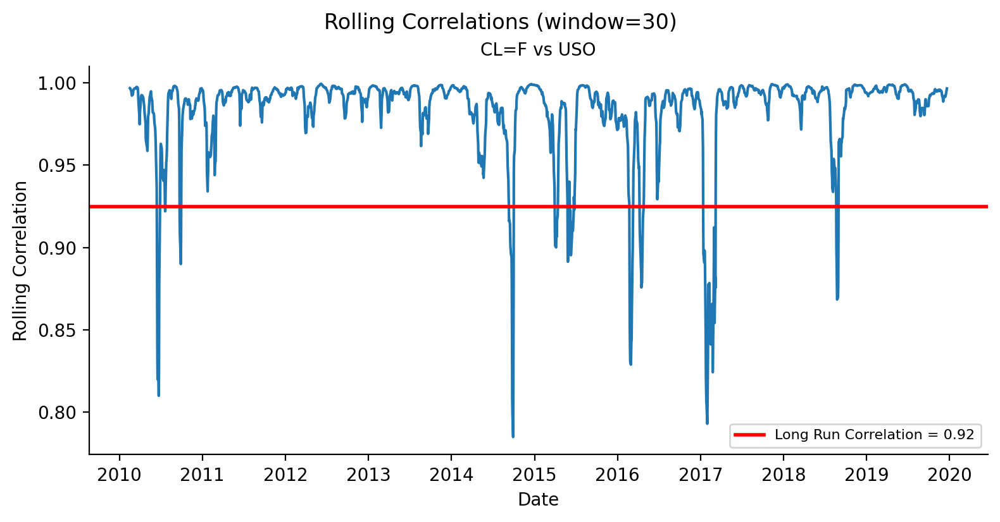

In [69]:
ph.plot_rolling_correlation(oil_pairs)

The rolling correlation between CL=F (WTI Crude Oil Futures) and USO (United States Oil Fund) remains consistently high, reflecting USO’s strong dependency on WTI futures for tracking crude oil prices. Despite this close relationship, occasional short-term dips in correlation are observed, likely due to tracking errors caused by USO’s futures rolling strategy, fund fees, or other market dynamics. Lastly, the long-run correlation of 92% indicates a high linear dependence between those 2.

In [70]:
oil_beta = sh.get_beta_ols(oil_pairs, oil_pairs.columns)
oil_hr = [1, -oil_beta]
oil_spread = dph.compute_spread(oil_pairs, oil_pairs.columns, oil_hr)

ph.plot_spread(oil_pairs, oil_pairs.columns, oil_hr)
test_result = sh.adf_test(oil_spread)

ADF Test Results for spread:
Test Statistic: -2.3633
p-value: 0.1524
Critical Values:
    1%: -3.4330
    5%: -2.8627
    10%: -2.5674



Surprisingly, despite the 2 being highly correlated they don't show any cointegration relationships.

### 1.2 **Aluminum vs Natural Gas (Electolysis)**

We use the front-month futures contracts **ALI=F** for aluminum, which represents global benchmark aluminum prices traded on the London Metal Exchange (LME), and **NG=F** for natural gas, which tracks Henry Hub natural gas futures, a key benchmark for U.S. natural gas prices traded on the NYMEX.

This category focuses on the connection between aluminum and natural gas, with natural gas serving as a primary energy source for the **electrolysis** process in aluminum production. Fluctuations in natural gas prices directly impact aluminum production costs, creating a meaningful economic relationship between these two assets.

<img src="https://cdn1.byjus.com/wp-content/uploads/2016/01/Electrolysis3.png" alt="Image Description" width="600"/>

*Source: [BYJU'S](https://cdn1.byjus.com/wp-content/uploads/2016/01/Electrolysis3.png)*


In [71]:
elec_tickers = [
    "ALI=F",  # Aluminium Futures
    "NG=F",  # Henry Hub Natural Gas Futures
]
economic_pairs.append(elec_tickers)
elec_pairs = prices[elec_tickers].dropna()
elec_pairs

Ticker,ALI=F,NG=F
Date,,
2014-05-06,2172.75,4.799
2014-05-07,2149.00,4.740
2014-05-08,2141.75,4.572
2014-05-09,2107.25,4.531
2014-05-12,2088.25,4.434
...,...,...
2019-12-16,1784.75,2.341
2019-12-17,1774.25,2.319
2019-12-18,1788.75,2.286


In [72]:
ph.plot_normalized_prices(elec_pairs)

Both assets saw significant declines during **2015–2016**, driven by oversupply and weak global demand in the commodities market. Natural gas prices dropped sharply due to the U.S. shale boom, mild winters that reduced heating demand, and storage concerns, with prices often spiking during the winter season starting in November. Aluminum prices also declined during this period, largely due to oversupply from Chinese production and sluggish demand in industrial sectors like construction and manufacturing.

Following the **2015–2016 downturn**, both prices recovered until 2018. However, aluminum futures exhibited little to no price movement from 2018 until June 2019.

**References:**
1.	**SMM, 2016.** [“What Changes Happened in China Aluminum Market in 2016 After Price Surges?”](https://news.metal.com/newscontent/100720886/what-changes-happen-in-china-aluminum-market-in-2016-after-price-surges-smm-exclusive)
2.	**EIA, 2016** [“U.S. Natural Gas Prices in 2016 Were the Lowest in Nearly 20 Years”](https://www.eia.gov/todayinenergy/detail.php?id=29552)

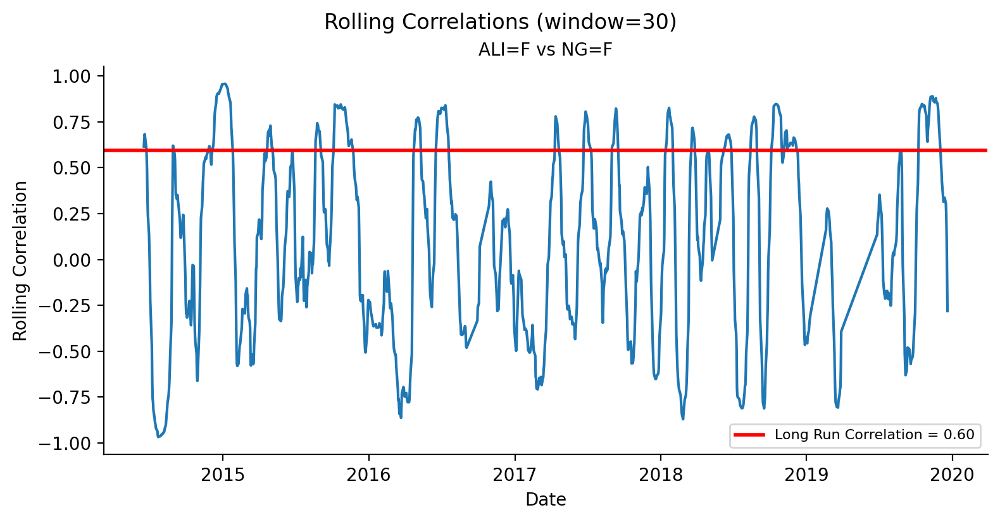

In [73]:
ph.plot_rolling_correlation(elec_pairs)

Despite having a strong economic relationships, ALuminium and Natural gas prices show a weaker linear relationships with a long-run correlation of only **60%**.
However, over shorter periods their linear correlation appears to show a strong cylycality, potentially indicating a mean-reverting spread process.

In [74]:
elec_beta = sh.get_beta_ols(elec_pairs, elec_pairs.columns)
elec_hr = [1, -elec_beta]
elec_spread = dph.compute_spread(elec_pairs, elec_pairs.columns, elec_hr)

ph.plot_spread(elec_pairs, elec_pairs.columns, elec_hr)
test_result = sh.adf_test(elec_spread)

ADF Test Results for spread:
Test Statistic: -2.7219
p-value: 0.0703
Critical Values:
    1%: -3.4351
    5%: -2.8636
    10%: -2.5679



Here also, we cannot assert at 5% risk level that the 2 are cointegrated, even though we have a lower correlation and a lower pvalue compared WTI and USO studied previously.

### 1.3 **Crude Oil vs Natural Gas (Associated Gas)**

We use the front-month WTI Crude Oil futures contracts (CL=F), and the **Henry Hub Natural Gas (NG=F)** futures. Additionally, we include the **SPDR S&P Oil & Gas Exploration & Production ETF (XOP)**, which encompasses companies involved in both oil and natural gas exploration and production in the U.S.

This category focuses on the relationship between crude oil and natural gas. Natural gas is often produced as a **byproduct** of crude oil extraction, a phenomenon known as **associated gas**, linking the prices of these two commodities. The XOP ETF, which reflects a mix of oil and gas companies, may also show strong correlations with both crude oil and natural gas prices, providing opportunities to explore their interconnected dynamics.

<img src="https://www.mwm.net/wp-content/uploads/2021/10/MWM-Petroleum-Associated-Gas_EN.jpg" alt="Image Description" width="600"/>

*Source: [MWM](https://insidelines.pjm.com/two-major-grid-operators-embark-on-joint-planning-endeavor-to-enhance-reliability/)*

**References:**
1.	**U.S. Energy Information Administration (EIA), 2022.** [“U.S. associated natural gas production will likely grow through 2050”](https://www.eia.gov/todayinenergy/detail.php?id=56120)
2. **U.S. Energy Information Administration (EIA), 2023.** [US Associated Gas Production Increased Nearly 8%](https://www.ogj.com/general-interest/article/55242758/us-associated-gas-production-increased-nearly-8-in-2023)

In [75]:
assoc_gas_tickers = [
    "CL=F",  # WTI Futures
    "NG=F", # Henri Hub Natural gas Futures
    "XOP"  # SPDR S&P Oil & Gas Exploration & Production ETF
]
economic_pairs.append(assoc_gas_tickers)
assoc_gas_pairs = prices[assoc_gas_tickers].dropna()
assoc_gas_pairs

Ticker,CL=F,NG=F,XOP
Date,,,
2010-01-04,81.510002,5.884,172.559998
2010-01-05,81.769997,5.637,174.000000
2010-01-06,83.180000,6.009,175.960007
2010-01-07,82.660004,5.806,174.919998
2010-01-08,82.750000,5.749,176.279999
...,...,...,...
2019-12-16,60.209999,2.341,89.519997
2019-12-17,60.939999,2.319,91.879997
2019-12-18,60.930000,2.286,92.440002


In [76]:
ph.plot_normalized_prices(assoc_gas_pairs)

This plot shows the normalized prices of WTI crude oil futures (CL=F), Henry Hub natural gas futures (NG=F), and the XOP ETF. Crude oil and XOP exhibit a strong correlation, reflecting their shared exposure to oil prices, while natural gas demonstrates more independent behavior with noticeable volatility, including a sharp decline during the 2015–2016 commodities downturn.

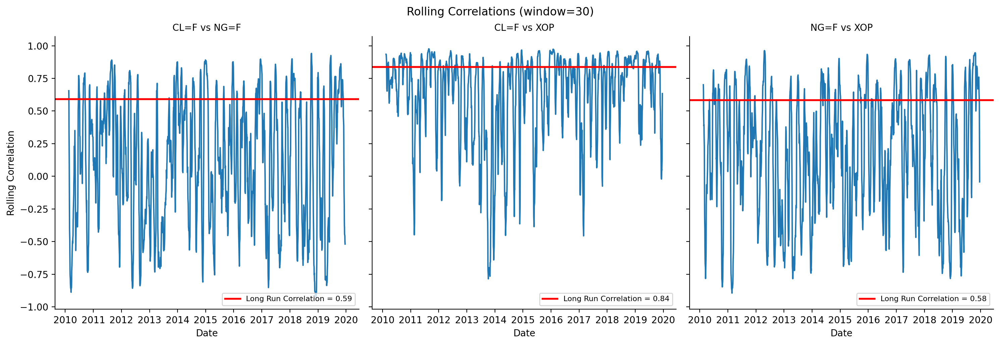

In [77]:
ph.plot_rolling_correlation(assoc_gas_pairs, height=5, aspect=1)

Only WTI Futures and XOP diplay a strong linear relatinships over time, whereas Natural Gas appears slightly statistically correlated wiht both WTI and XOP.

In [78]:
trace_results, _, assoc_gas_hr = sh.johansen_test(assoc_gas_pairs, assoc_gas_pairs.columns)
assoc_gas_spread = dph.compute_spread(assoc_gas_pairs, assoc_gas_pairs.columns, assoc_gas_hr)

ph.plot_spread(assoc_gas_pairs, assoc_gas_pairs.columns, assoc_gas_hr)
trace_results

,Hypothesis (r),Trace Statistic,Critical Value (5%),Reject H0?
0,r ≤ 0,29.550229,29.7961,False
1,r ≤ 1,8.399734,15.4943,False
2,r ≤ 2,2.886075,3.8415,False


Despite being close to rejet the null hypothesis for $r \le 0$, the trace results sugguest that there is 0 linear combinations of the 3 assets that can make the spread stationary at the 5% significance level.

### 1.4 **Electricity vs Natural Gas (Power Generation Linkage)**

We use the front-month **Henry Hub natural gas futures contract (NG=F)** and the **PJM Western Hub Real-Time Off-Peak Calendar-Month 5 MW** Futures as representative benchmarks for natual gas and electricity prices in the US. The PJM data reflects electricity prices traded in the real-time market for the Western Hub, a critical trading hub for electricity in the PJM Interconnection region.

Natural gas serves as the primary fuel source for electricity generation, especially in regions like PJM where it ammounts to almost **45%**, making it a key driver of electricity prices. Fluctuations in natural gas prices directly affect electricity production costs, creating a meaningful economic relationship between these two assets.

<img src="https://www.esaipower.com/wp-content/uploads/2023/08/ISO-RTO-Map.jpg" alt="PJM and MISO Grid Operators" width="600"/>

*Source: [PJM Insights](https://insidelines.pjm.com/two-major-grid-operators-embark-on-joint-planning-endeavor-to-enhance-reliability/)*

**References:**
1. **PJM, 2022.** ["Natural Gas generation in PJM"](https://learn.pjm.com/three-priorities/keeping-the-lights-on/gas-electric-industry)
2.	**U.S. Energy Information Administration (EIA), 2023.** ["Natural Gas Plays a Major Role in U.S. Electricity Generation"](https://www.eia.gov/todayinenergy/detail.php?id=61444#:~:text=Natural%20gas%20is%20the%20single,in%202023%2C%20trailing%20only%20solar.)

In [79]:
gas = prices["NG=F"]

elect = pd.read_csv("PJM Western Hub Real-Time Off-Peak Calendar-Month 5 MW Futures Historical Data.csv",
                   index_col=["Date"], usecols=["Date", "Price"], parse_dates=True)
elect = elect.sort_index()
elect.index = pd.to_datetime(elect.index)
elect.columns = ["PJM"]

elect_gas_pairs = pd.merge(gas, elect, left_index=True, right_index=True, how="outer")
elect_gas_pairs["PJM"] = elect_gas_pairs["PJM"].interpolate() # Interpolate the 2015 Crash 
elect_gas_pairs = elect_gas_pairs.dropna()

elect_gas_pairs


,NG=F,PJM
Date,,
2012-10-15,3.486,31.55
2012-10-16,3.437,31.55
2012-10-17,3.470,31.95
2012-10-18,3.587,32.20
2012-10-19,3.617,32.50
...,...,...
2019-12-16,2.341,31.25
2019-12-17,2.319,30.95
2019-12-18,2.286,30.35


In [80]:
ph.plot_normalized_prices(elect_gas_pairs)

Both assets exhibit seasonal spikes during winter periods, reflecting increased demand for heating and electricity generation. While natural gas shows moderate fluctuations, PJM prices display greater volatility, including a sharp spike during 2014 due to the [**Polar Vortex**](https://www.weather.gov/safety/cold-polar-vortex). The correlation between the two reflects the reliance of electricity generation on natural gas, though PJM prices are also influenced by regional factors.

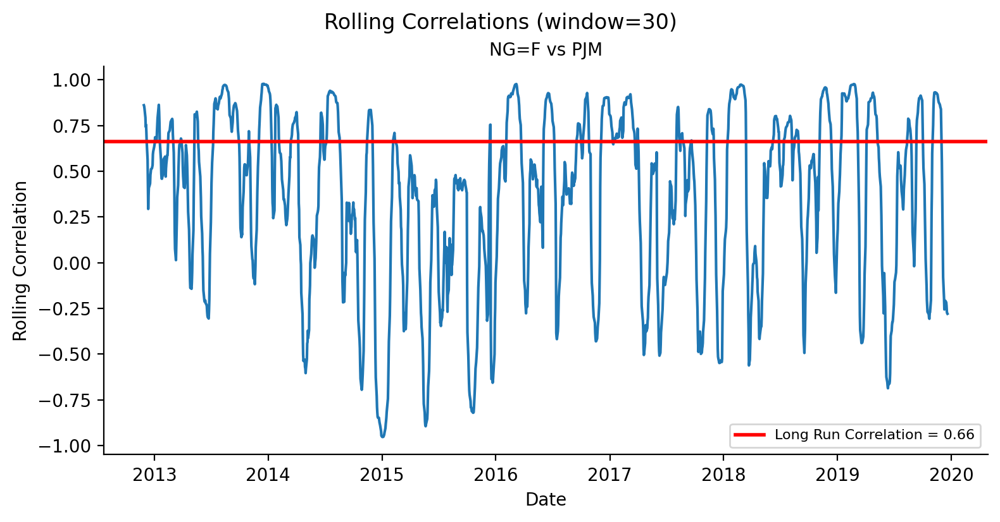

In [81]:
ph.plot_rolling_correlation(elect_gas_pairs)

In [82]:
elect_gas_beta = sh.get_beta_ols(elect_gas_pairs, elect_gas_pairs.columns)
elect_gas_hr = [1, -elect_gas_beta]
elect_gas_spread = dph.compute_spread(elect_gas_pairs, elect_gas_pairs.columns, elect_gas_hr)

ph.plot_spread(elect_gas_pairs, elect_gas_pairs.columns, elect_gas_hr)
test_result = sh.adf_test(elect_gas_spread)

ADF Test Results for spread:
Test Statistic: -2.9286
p-value: 0.0421
Critical Values:
    1%: -3.4340
    5%: -2.8632
    10%: -2.5676



For the pair formed by Natural Gas and Electricy prices, we cannot accept the null hypothesis that states that both pairs are not stationary.

### 1.5 **Crude Oil vs Heating Oil vs Gasoline (Crack Spread)**

We use the **WTI Crude Oil futures contract (CL=F)** as a benchmark for U.S. crude oil prices, along with **Heating Oil (HO=F)** and **RBOB Gasoline (RB=F)** to represent refined petroleum products.

This category focuses on the crack spread, a key measure of **refinery margins**. The crack spread reflects the difference between the price of crude oil and the prices of its refined products, such as gasoline and heating oil which are two of the primary outputs of refining. It provides insights into refinery profitability and serves as a valuable tool for hedging and trading in energy markets.

In [83]:
crack_tickers = [
    "CL=F",
    "HO=F",
    "RB=F"
]
economic_pairs.append(crack_tickers)

crack_pairs = prices[crack_tickers].interpolate().dropna()
crack_pairs

Ticker,CL=F,HO=F,RB=F
Date,,,
2010-01-04,81.510002,2.1905,2.1044
2010-01-05,81.769997,2.1941,2.1250
2010-01-06,83.180000,2.2032,2.1366
2010-01-07,82.660004,2.1836,2.1349
2010-01-08,82.750000,2.2003,2.1553
...,...,...,...
2019-12-16,60.209999,2.0045,1.6627
2019-12-17,60.939999,2.0334,1.6857
2019-12-18,60.930000,2.0203,1.6838


In [84]:
ph.plot_normalized_prices(crack_pairs)

This plot illustrates a highly correlated relationship among the prices, reflecting the close linkage between crude oil, heating oil, and gasoline prices within the context of the crack spread. Notably, the crack spread serves as a key industry benchmark and is even tradable as a financial instrument, such as the RBOB Gasoline Crack Spread Futures on the CME.

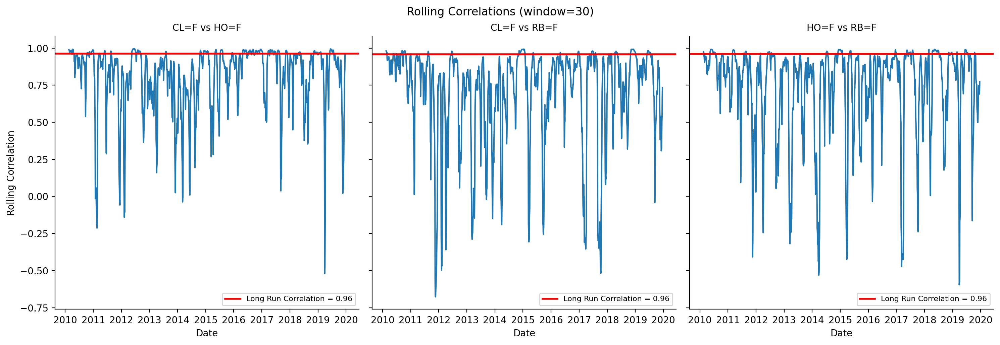

In [85]:
ph.plot_rolling_correlation(crack_pairs, height=5, aspect=1)

In [86]:
trace_results, _, crack_pairs_hr = sh.johansen_test(crack_pairs, crack_pairs.columns)
crack_pairs_spread = dph.compute_spread(crack_pairs, crack_pairs.columns, crack_pairs_hr)

ph.plot_spread(crack_pairs, crack_pairs.columns, crack_pairs_hr)
trace_results

,Hypothesis (r),Trace Statistic,Critical Value (5%),Reject H0?
0,r ≤ 0,40.565878,29.7961,True
1,r ≤ 1,16.058259,15.4943,True
2,r ≤ 2,1.840649,3.8415,False


For the extended crack spread with 3 assets, we cannot reject teh null hypotheiss that there are 2 linear combinations of the assets that make the spread stationary at the 5% risk level. This gives us an extra layer of confidence compared to the existence of only 1 linear combination.

### 1.6 **Crude Oil vs Oil Stock (Profit Margins)**

We use **Brent Crude Oil futures (BZ=F)** as a global benchmark and **Shell (SHEL)** as a major oil stock. Brent Crude is chosen over WTI due to its relevance to offshore fields, aligning with Shell’s operations in the North Sea, where it has played a key role in Brent field development, linking Shell’s profitability to Brent prices.

This category focuses on the relationship between global crude oil prices and the profit margins of integrated oil companies like Shell, which are influenced by both upstream extraction costs and downstream refining activities. Exploring the co-movement between Brent Crude and Shell’s stock price offers insights into how oil price fluctuations impact the broader energy sector.

In [87]:
brent_shell_tickers = [
    "BZ=F",
    "SHEL",
]
economic_pairs.append(brent_shell_tickers)

brent_shell_pairs = prices[brent_shell_tickers].dropna()
brent_shell_pairs

Ticker,BZ=F,SHEL
Date,,
2010-01-04,80.120003,62.349998
2010-01-05,80.589996,62.419998
2010-01-06,81.889999,61.910000
2010-01-07,81.510002,61.610001
2010-01-08,81.370003,61.520000
...,...,...
2019-12-16,65.339996,58.160000
2019-12-17,66.099998,58.470001
2019-12-18,66.169998,58.520000


In [88]:
ph.plot_normalized_prices(brent_shell_pairs)

This plot displays the normalized prices of Brent Crude Oil futures (BZ=F) and Shell (SHEL). The two exhibit a strong correlation, reflecting the significant influence of Brent Crude prices on Shell’s operations and profitability. Both assets experience similar trends, including a sharp decline during the 2014–2016 oil price collapse caused by oversupply and weak global demand.

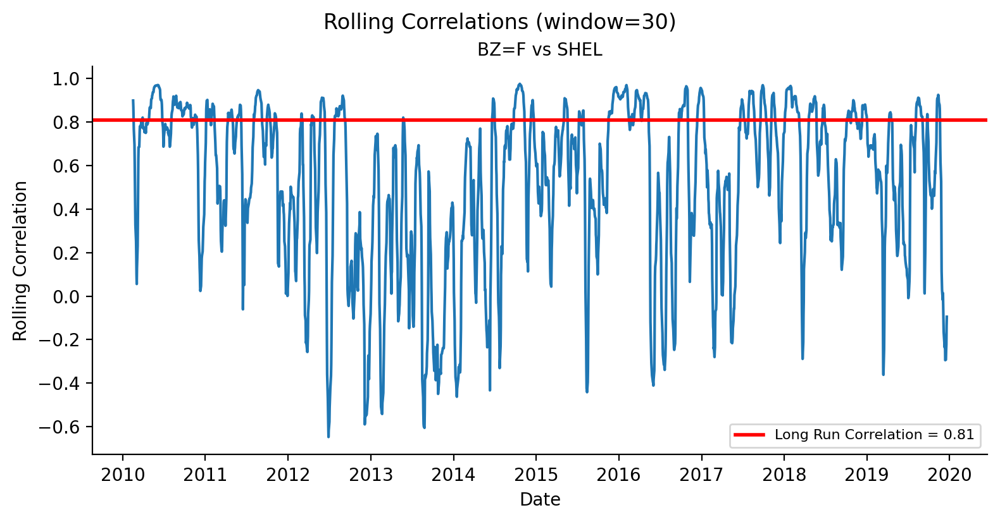

In [89]:
ph.plot_rolling_correlation(brent_shell_pairs)

The long-run correlation is relatively high at 0.81, indicating a strong relationship between Brent oil prices and Shell’s stock performance. However, the rolling correlation shows significant fluctuations over time, highlighting periods of divergence likely influenced by company-specific factors, market conditions, or macroeconomic events. These deviations from the long-run average present potential opportunities for pair trading

In [90]:
brent_shell_beta = sh.get_beta_ols(prices, brent_shell_tickers)
brent_shell_hr = [1, -brent_shell_beta]
brent_shell_spread = dph.compute_spread(prices, brent_shell_tickers, brent_shell_hr)

ph.plot_spread(prices, brent_shell_tickers, brent_shell_hr)
test_spread = sh.adf_test(brent_shell_spread)

ADF Test Results for spread:
Test Statistic: -2.9723
p-value: 0.0376
Critical Values:
    1%: -3.4330
    5%: -2.8627
    10%: -2.5674



Here also we cannot accept the null hypothesis of the presence of a unit root in the spread at the 5% risk level thus poentially making it stationary.

## 2. **Statistical-Based Pair Selection**

This section uses statistical techniques to identify asset pairs or baskets with strong relationships. We first apply independent methods like correlation, cointegration, and Hurst exponent to filter pairs based on specific criteria. Then, we implement a sequential filtering pipeline to refine the selection, combining the strengths of multiple methods. Finally, we compare the results to evaluate the effectiveness of each approach and highlight robust trading opportunities.

### 2.1. **Correlation Filter**

This is one of the most widely used and straightforward methods for identifying pairs or baskets of assets. Correlation measures the strength of the linear relationship between two variables, with Pearson's correlation coefficient ($\rho$) ranging from -1 to 1. A value close to 1 indicates a strong positive relationship, while -1 indicates a strong negative one. Mathematically, ($\rho$) is calculated as:

$$
\rho_{X,Y} = \frac{\text{Cov}(X, Y)}{\sigma_X \sigma_Y}
$$

By setting a threshold (e.g. $\rho > 0.8$), the correlation filter selects assets that move together historically.

While this method is computationally efficient and easy to implement, it is susceptible to issues like spurious correlations. Since the goal is to identify pairs with meaningful long-term relationships, correlation alone may not be sufficient. While it serves as a valuable starting point, it does not guarantee profitability or economic significance.

In [91]:
corr_threshold = 0.8
corr_matrix, corr_pairs= sh.compute_corr_matrix(prices, threshold=corr_threshold)
ph.plot_heatmap(corr_matrix, method_name="correlation", pairs=corr_pairs, color_scale="tempo", mask_lower=True)

The heatmap shows strong clusters of correlation among energy-related assets, particularly between crude oil futures (BZ=F and CL=F), gasoline futures (RB=F), and heating oil futures (HO=F), all exceeding the 0.95 threshold. In addition, USO and XOP ETFs show strong correlation with most oil futures.

In [92]:
ph.plot_hist(corr_matrix,method_name="Correlation", threshold=corr_threshold)

In [93]:
def compute_pct_exceed_thresh(prices, pairs):
    n_valid_pairs = len(pairs)
    n = len(prices.columns)
    n_total_pairs = n * (n-1) / 2 # Total number of unique pairs (excluding diagonals)
    return n_valid_pairs / n_total_pairs

In [94]:
pct_val_pairs_corr = compute_pct_exceed_thresh(prices, corr_pairs)
print(f"Percentage of valid pairs for the correlation of {corr_threshold}: {pct_val_pairs_corr*100:.2f}%")

Percentage of valid pairs for the correlation of 0.8: 15.33%


By setting a conservative value for the correlation filter can eliminate, it can restruct significantly the asset space, poentailly eliminating profitabel mean-reverting pairs that do not show extremely high linear dependence.

Instead, the correlation filter is often used as a pre-filter with a less conservative value (typicalling less than 60% to 70%).

In [95]:
corr_threshold = 0.7
corr_matrix, corr_pairs= sh.compute_corr_matrix(prices, threshold=corr_threshold)
pct_val_pairs_corr = compute_pct_exceed_thresh(prices, corr_pairs)
print(f"Percentage of valid pairs for the correlation of {corr_threshold}: {pct_val_pairs_corr*100:.2f}%")

Percentage of valid pairs for the correlation of 0.7: 25.67%


### 2.2. **Cointegration Filter**

Cointegration is a statistical method used to identify pairs of assets with a stable long-term relationship, even if they diverge in the short term. Unlike correlation, which measures short-term linear relationships, cointegration tests whether a linear combination of two time series forms a stationary spread. For instance, if two assets $X_t$ and $Y_t$ are cointegrated, their residual spread:

$$
Z_t = X_t - \beta Y_t
$$

remains mean-reverting over time. This makes cointegration particularly useful in pairs trading, where profitability often relies on reversion to a long-term equilibrium.

While cointegration offers deeper insights than correlation, it is computationally more intensive and assumes a linear relationship. However, it is a key method for identifying meaningful pairs in statistical arbitrage.

In [96]:
pvalue_threshold = 0.05
coint_matrix, coint_pairs= sh.compute_coint_matrix(prices, threshold=pvalue_threshold)
ph.plot_heatmap(coint_matrix, method_name="cointegration", pairs=coint_pairs, color_scale="Cividis")

As cointegration is not symmetrical like correlation, the order in which the two assets are tested matters. For example, the pair ALI=F vs. BZ=F shows a p-value of 19%, while the symmetric pair BZ=F vs. ALI=F exhibits a much lower p-value of 1%. As a result, it is necessary to compute the entire matrix, including both upper and lower triangles, to capture all possible cointegration relationships.

In [97]:
ph.plot_hist(coint_matrix, method_name="Cointegration", threshold=pvalue_threshold)

Compared to the correlation's distribution the pvalue distribution is almost uniform but with the mode being in the [0, 1%] pvalue bin.

In [98]:
pct_val_pairs_coint = compute_pct_exceed_thresh(prices, coint_pairs)
print(f"Percentage of valid pairs for the correlation of {pvalue_threshold}: {pct_val_pairs_coint*100:.2f}%")

Percentage of valid pairs for the correlation of 0.05: 27.45%


### 2.3 **Hurst Exponent Filter**

The Hurst exponent is a measure of the persistence or mean-reverting nature of a time series. It quantifies whether a time series exhibits a trending ($H > 0.5$), random walk ($H \approx 0.5$), or mean-reverting ($H < 0.5$) behavior. For pairs trading, we are particularly interested in identifying spreads that are mean-reverting, as this behavior is crucial for profitability.

The Hurst exponent is calculated based on how the variability of a time series scales with time. One common method involves measuring the standard deviation of lagged differences and regressing the logarithm of the lag against the logarithm of the standard deviation. Mathematically:

$$
\log(\text{Standard Deviation}) = H \cdot \log(\text{Lag}) + C
$$

Where $H$ is the Hurst exponent and $C$ is a constant. For simplicity, this method is used in our analysis.

While the Hurst exponent provides insights into the time series’ behavior, it is sensitive to the choice of lag and requires sufficient data length for accurate estimation. Despite these challenges, it is a valuable tool for filtering pairs with promising mean-reverting characteristics.

In [99]:
hurst_threshold = 0.5
hurst_matrix, hurst_pairs = sh.compute_hurst_matrix(prices, threshold=hurst_threshold, max_lag=50)
ph.plot_heatmap(hurst_matrix, method_name="hurst", pairs=hurst_pairs, color_scale="Brwnyl")

Applying the filter $H < 0.5$ to identify mean-reverting pairs appears to lack robustness, as it results in a large proportion of pairs being classified as valid. For example, a value of 0.49, though slightly below 0.5, is only marginally mean-reverting and may not exhibit strong mean-reversion in practice. To improve reliability, a stricter threshold, such as 0.45, could be adopted to better capture pairs with more pronounced mean-reverting behavior.

In [100]:
ph.plot_hist(hurst_matrix, method_name="hurst", threshold=hurst_threshold)

The majority of Hurst exponent values are less than 0.5, indicating a high proportion of pairs that exhibit marginally mean-reverting or random-walk-like behavior. By setting a stricter threshold at 0.45, the selection focuses on pairs with stronger mean-reverting characteristics, ensuring a more robust filtering process.

In [101]:
hurst_threshold = 0.45
hurst_matrix, hurst_pairs = sh.compute_hurst_matrix(prices, threshold=hurst_threshold, max_lag=50)
ph.plot_heatmap(hurst_matrix, method_name="hurst", pairs=hurst_pairs, color_scale="dense")

Compared to the previous threshold of 0.5, this stricter criterion results in fewer valid pairs, focusing on those with more robust statistical properties for mean reversion.

### 2.4. **Filtering Pipeline: Correlation + Cointegration + Hurst**

The Filtering Pipeline combines multiple statistical methods—correlation, cointegration, and the Hurst exponent—to improve the robustness of selected pairs. Applying these techniques sequentially allows us to leverage their complementary strengths while addressing their individual limitations. In our case, we are going to use relevent values presented previously, except for the correlation filter where we use a less conservative value.

This pipeline operates as follows:
- **Correlation Pre-Filter:** Retain pairs with a correlation coefficient > 0.60.
- **Cointegration Filter:** Select pairs with a cointegration p-value < 0.05.
- **Hurst Exponent Filter:** Focus on pairs with a Hurst exponent < 0.45, indicating strong mean reversion.

By combining these filters, the pipeline balances computational efficiency and statistical rigor, ensuring the selection of pairs with strong potential for profitable trading.

In [102]:
corr_threshold = 0.6
corr_matrix, corr_pairs = sh.compute_corr_matrix(prices, threshold=corr_threshold)

Since some pairs risk to be selected twice, for instance CL=F vs BZ=F and BZ=F vs CL=F, we choose the one that performs the best accoriding to the criterias defined above.

In [103]:
def compute_pair_score(pair, corr_matrix, coint_matrix, hurst_matrix, weights=[0.2, 0.4, 0.4]):
    """
    Compute a score for a given pair based on correlation, cointegration p-value, and Hurst exponent.

    Args:
        pair (tuple): A tuple of two tickers (asset1, asset2).
        corr_matrix (pd.DataFrame): Correlation matrix.
        coint_matrix (pd.DataFrame): Cointegration p-value matrix.
        hurst_matrix (pd.DataFrame): Hurst exponent matrix.
        weights (list): Weights used to combine the three metrics (correlation, cointegration, and Hurst) into a single score. 
                        The weights should sum to 1. Default is [0.2, 0.4, 0.4].

    Returns:
        float: Composite score for the pair.
    """
    if len(weights) != 3:
        raise ValueError("Weigths must contain 3 values ")
    if sum(weights) != 1:
        raise ValueError("Sm of weights must be equal to 1")
    
    asset1, asset2 = pair
    corr = corr_matrix.loc[asset1, asset2]
    coint_pvalue = coint_matrix.loc[asset1, asset2]
    hurst = hurst_matrix.loc[asset1, asset2]
    
    score_corr = corr                # Higher correlation is better
    score_coint = 1 - coint_pvalue  # Lower p-value is better
    score_hurst = 1 - hurst        # Lower Hurst is better
    
    composite_score = weights[0]*score_corr + weights[1]*score_coint + weights[2]*score_hurst
    return composite_score


def remove_duplicates(pairs, corr_matrix, coint_matrix, hurst_matrix):
    """
    Remove duplicate pairs by retaining the one with the highest composite score,
    but preserve unique pairs that appear only once.

    Args:
        pairs (list): List of selected pairs (tuples of assets).
        corr_matrix, coint_matrix, hurst_matrix: Matrices used for scoring.

    Returns:
        list: Refined list of pairs with duplicates resolved and unique pairs preserved.
    """
    duplicate_pairs = {}  # To track the highest-scoring pair for duplicates
    pair_counts = {}   # To count occurrences of pairs (unordered)

    for pair in pairs:
        key = frozenset(pair)
        pair_counts[key] = pair_counts.get(key, 0) + 1

    refined_pairs = []
    for pair in pairs:
        key = frozenset(pair)
        if pair_counts[key] == 1:
            # Keep pairs that appear only once 
            refined_pairs.append(pair)
        else:
            # Handle duplicated pairs by selecting the highest-scoring pair
            score = compute_pair_score(pair, corr_matrix, coint_matrix, hurst_matrix)
            if key not in duplicate_pairs or score > duplicate_pairs[key][1]:
                duplicate_pairs[key] = (pair, score)

    refined_pairs.extend(value[0] for value in duplicate_pairs.values())

    return refined_pairs, pair_counts

In [104]:
pairs = list(set(corr_pairs).intersection(set(coint_pairs)).intersection(set(hurst_pairs)))

statistical_pairs, pair_counts = remove_duplicates(
    pairs=pairs,
    corr_matrix=corr_matrix,
    coint_matrix=coint_matrix,
    hurst_matrix=hurst_matrix
)

In [105]:
spreads = dph.compute_spreads(prices, statistical_pairs)
ph.plot_spreads(spreads, num_cols=5, width=1100)

In [106]:
all_pairs = {
    "statistical_pairs": {},
    "economic_pairs": {}
}

for i, pair in enumerate(statistical_pairs):
    key = f"Pair{i+1}"
    all_pairs["statistical_pairs"][key] = list(pair)

for i, pair in enumerate(economic_pairs):
    key = f"Pair{i+1}"
    all_pairs["economic_pairs"][key] = list(pair)

# Write to JSON file
with open("valid_pairs.json", "w") as f:
    json.dump(all_pairs, f, indent=4)